In [22]:
import pandas 
import numpy
import matplotlib.pyplot as plt
import networkx as nx

In [23]:
dataframe=pandas.read_csv("GRN_source_Target_TFS - GRN_source_Target_TFS.csv",encoding='utf-8')

dataset=dataframe.values

source=dataset[:,1]
target=dataset[:,2]

print(source)
print(target)


['ABL1' 'AHR' 'APC' ... 'ZNF382' 'ZNF383' 'ZNF423']
['BCL2' 'FOS' 'BIRC5' ... 'STAT5B' 'JUN' 'BRCA1']


In [24]:
# a=numpy.unique(source)
# print(len(target))
# ! pip3 list matplotlib
# ! pip3 uninstall matplotlib
# ! pip3 install matplotlib==2.1.1

<function matplotlib.pyplot.show(*args, **kw)>

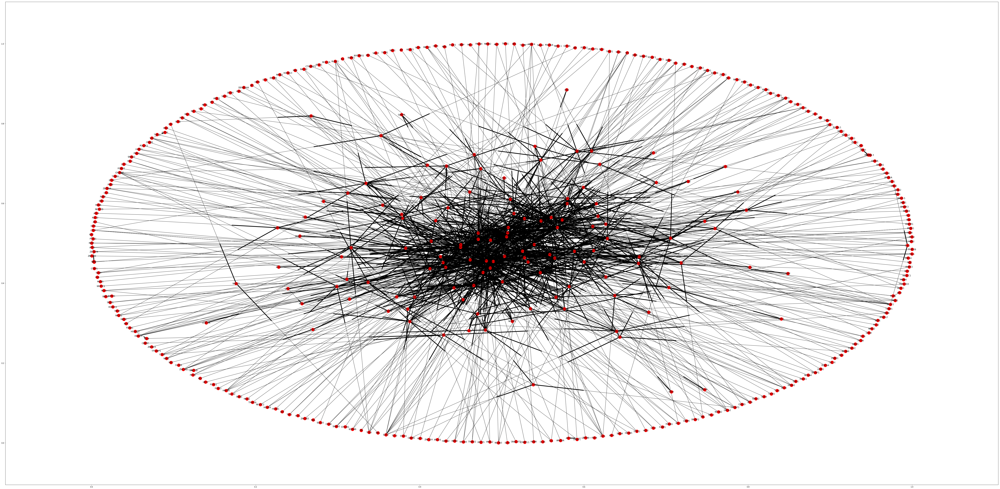

In [60]:
g=nx.DiGraph()



for i in range(len(source)):
    g.add_edges_from([(source[i],target[i])])

    
plt.figure (figsize =(100,50))
nx.draw_networkx(g)
plt.show
    



No More cycles left


<function matplotlib.pyplot.show(*args, **kw)>

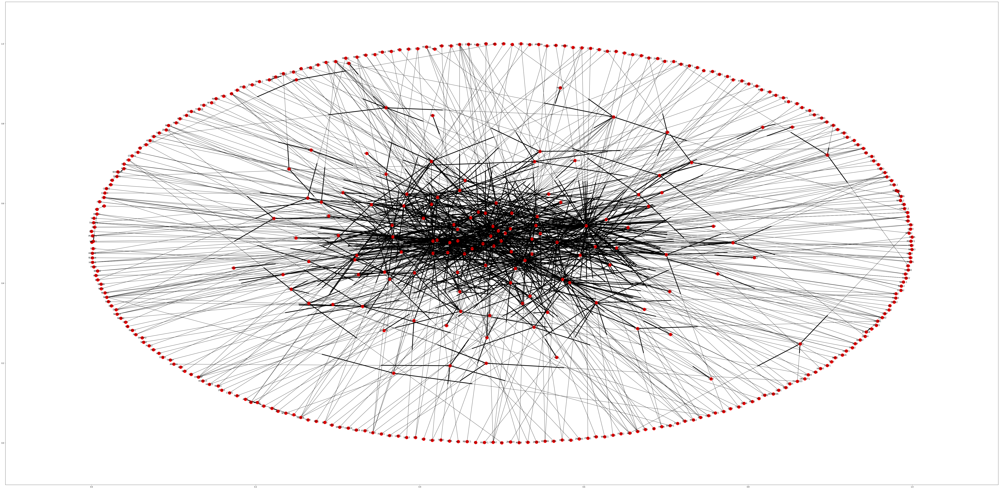

In [63]:
found_cycle = True
while (found_cycle):
    try:
        cycle= nx.find_cycle(g)
        g.remove_edge(cycle[-1][0],cycle[-1][1])
        print("Removing Cycle: ")
        for i in cycle:
            print(i[0], " -> ", end='')
        print(cycle[0][0])
    except:
        print("No More cycles left")
        
        found_cycle = False


plt.figure (figsize =(100,50))
nx.draw_networkx(g)
plt.show



In [71]:
dataframe=pandas.read_csv("GRN_source_target_network_analyze - TFs_15_Target_TFS.csv default n.csv",encoding='utf-8')
dataset2=dataframe.values

gene=dataset2[:,1]
centerality=dataset2[:,2]

association={}

for i,g in enumerate(gene):
    association[g]=centerality[i]
    
# print(association)


In [86]:
#dictionary to store all parents of a child as lists of repressing,activating and unknown parents
#{child: [repressed:[],active:[],unknown:[]]}
activation=dataset[:,1:4]

child_parent = {}
for x in range(len(activation)):
    parent = activation[x][0]
    child = activation[x][1]
    mode = activation[x][2]
    if child not in child_parent:
        if mode == 'Unknown':
            child_parent[child] = [[],[],[]]
            child_parent[child][2].append(parent)
        elif mode == 'Activation':
            child_parent[child] = [[],[],[]]
            child_parent[child][1].append(parent)
        else:
            child_parent[child] = [[],[],[]]
            child_parent[child][0].append(parent)

            

    else:
        if mode == 'Unknown':
            child_parent[child][2].append(parent)
        elif mode == 'Activation':
            child_parent[child][1].append(parent)
        else:
            child_parent[child][0].append(parent)

            
    
        
    

In [87]:
def find_interaction(child,parent,child_parent):
    if parent in child_parent[child][0]:
        return 0 
    elif parent in child_parent[child][1]:
        return 1
    elif parent in child_parent[child][2]:
        return 0.5

In [88]:
print(find_interaction('ESR1','ARNT',child_parent))

0.5


In [82]:
#this fucntion infers the probabilty of a child being active based on it's parents and grandparents probabilties 
#in a cascaded effect
def find_parent_grandparent(child,child_parent,p_centerality):
    total_pcenterality=0
    centeralities=0
    for i in child_parent[child][0]:
        total_pcenterality+=p_centerality[i]
    for i in child_parent[child][1]:
        total_pcenterality+=p_centerality[i]
        centeralities+=p_centerality[i]
    for i in child_parent[child][2]:
        total_pcenterality+=p_centerality[i]
        centeralities+=(p_centerality[i]*0.5)
    parent_probability=centeralities/total_pcenterality
    
    grand_parent_prob=0
    for i in child_parent[child][0]:
        if i in child_parent:
            for j in child_parent[i][0]:
            
                total_pcenterality+=p_centerality[j]
            for j in child_parent[i][1]:
                total_pcenterality+=p_centerality[j]
                grand_parent_prob+=p_centerality[j]
            for j in child_parent[i][2]:
                total_pcenterality+=p_centerality[j]
                grand_parent_prob+=p_centerality[j]
            
    for i in child_parent[child][1]:
        if i in child_parent:
            for j in child_parent[i][1]:
                total_pcenterality+=p_centerality[j]
                grand_parent_prob+=p_centerality[j]
            for j in child_parent[i][0]:
                total_pcenterality+=p_centerality[j]
                
            for j in child_parent[i][2]:
                total_pcenterality+=p_centerality[j]
                grand_parent_prob+=(p_centerality[j]*0.5)
            
    for i in child_parent[child][2]:
        if i in child_parent:
            for j in child_parent[i][1]:
                total_pcenterality+=p_centerality[j]
                grand_parent_prob+=p_centerality[j]
            for j in child_parent[i][0]:
                total_pcenterality+=p_centerality[j]
              
            for j in child_parent[i][2]:
                total_pcenterality+=p_centerality[j]
                grand_parent_prob+=(p_centerality[j]*0.5)
    grand_parent_prob=grand_parent_prob+centeralities
    g_prob=grand_parent_prob/total_pcenterality
            
    return parent_probability,g_prob
    

In [83]:
parent,grand_parent=find_parent_grandparent('JUN',child_parent,association)
print("Parent centerality = ", parent)
print("Grand parent probabilty =", grand_parent)

Parent centerality =  0.7608358713061957
Grand parent probabilty = 0.5562846574022873


In [78]:
# 1. Find the probability of switching on of the target gene ERBB2 given that gene AR is up (on). 
#this function calculates the probabilty of a child being activen given that a parent is active
def probParent(child,parent,mode):
    num = denom = 0 
    if mode == True:
        parents = child_parent[child][1]
        for parent in parents:
            num += association[parent]
        parents = child_parent[child][2]
        for parent in parents:
            denom += 0.5 * association[parent]
        denom = denom + num
    parentp , gp = find_parent_grandparent(parent,child_parent,association)
    return denom * association[parent]/parentp
probParent('ESR1','ARNT',True)

0.024466443176126795

In [79]:
# 2. Find the probability of switching off of the gene ATM given that genes ARNT and CTBP1 are off and on
# respectively.
parentp , grandparent = find_parent_grandparent('ARNT',child_parent,association)
parentpp = association['CTBP1']
parentppp , grandparent = find_parent_grandparent('ATM',child_parent,association)

print(parentppp/((1-parentp)+parentpp))


1.5486778666089283
